In [1]:
import numpy as np
import os
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import folium

import plotly.express as px
# !pip install --upgrade nbformat

In [2]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)

### 1. Fetch model output

In [3]:
ponds_filepath = os.path.join(
    os.environ['DATA'],
    'ponds_and_wells/output/17/gobindpur/gobindpur_COMBINED_GEOMETRY',
    'gobindpur_COMBINED_GEOMETRY.shp'
)

gobindpur_ponds_gdf = gpd.read_file(
    ponds_filepath
)

gobindpur_ponds_gdf

,FID,geometry
0,0,"MULTIPOLYGON (((86.30278 22.69427, 86.30278 22..."


In [4]:
# gobindpur_ponds_gdf['geometry'][0]

Split multipolygon into polygons

In [5]:
gobindpur_ponds_split_gdf = gobindpur_ponds_gdf.explode()

del gobindpur_ponds_gdf

print(gobindpur_ponds_split_gdf.shape)

(4849, 2)


In [6]:
gobindpur_ponds_split_gdf['FID'] = range(gobindpur_ponds_split_gdf.shape[0])

gobindpur_ponds_split_gdf.head()

,FID,geometry
0,0,"POLYGON ((86.30278 22.69427, 86.30278 22.69427..."
0,1,"POLYGON ((86.30085 22.89041, 86.30086 22.89042..."
0,2,"POLYGON ((86.30238 22.89038, 86.30239 22.89039..."
0,3,"POLYGON ((86.30269 22.64341, 86.30269 22.64342..."
0,4,"POLYGON ((86.30226 23.10471, 86.30226 23.10472..."


In [7]:
# gobindpur_ponds_split_gdf.explore()

Fetch block boundary

In [8]:
# gobindpur_boundary = gpd.read_file(
#     os.path.join('DATA'),
#     'ponds_and_wells',
#     'gobindpur_demographics.json'
# ) #has errors : someone should check the file format

In [9]:
gobindpur_boundary_gdf = gpd.read_file(
    os.path.join(os.environ['DATA'],
    'ponds_and_wells',
    'gobindpur_boundary.geojson')
)

# gobindpur_boundary_gdf['geometry'][0]

# gobindpur_boundary_gdf.dissolve()['geometry'][0]

In [10]:
gobindpur_boundary_single_gdf = gobindpur_boundary_gdf.dissolve()

Keep inference only within the block boundary

In [11]:
print(gobindpur_ponds_split_gdf.shape)

gobindpur_ponds_in_boundary_gdf = gobindpur_ponds_split_gdf.sjoin(gobindpur_boundary_single_gdf[['geometry']],
                            how = 'inner')

gobindpur_ponds_in_boundary_gdf.head()

(4849, 2)


,FID,geometry,index_right
0,526,"POLYGON ((86.24542 22.98588, 86.24542 22.9859,...",0
0,566,"POLYGON ((86.24094 22.97678, 86.24094 22.97679...",0
0,679,"POLYGON ((86.22695 22.97532, 86.22695 22.97532...",0
0,707,"POLYGON ((86.22416 22.97425, 86.22418 22.97426...",0
0,792,"POLYGON ((86.21476 22.99128, 86.21476 22.99129...",0


In [12]:
gobindpur_ponds_in_boundary_gdf = gobindpur_ponds_in_boundary_gdf[['FID','geometry']]

print(gobindpur_ponds_in_boundary_gdf.shape)

print(gobindpur_ponds_in_boundary_gdf.keys())

(1820, 2)
Index(['FID', 'geometry'], dtype='object')


In [13]:
# gobindpur_ponds_in_boundary_gdf.explore()

### 2. Fetch SWB data

In [14]:
# gobindpur_swb_gdf = gpd.read_file(
#     os.path.join(
#         os.environ['DATA'],
#         'ponds_and_wells',
#         'gobindpur_swb2.json'
#     )
# )

gobindpur_swb_allkeys_gdf = gpd.read_file(
    os.path.join(
        os.environ['DATA'],
        'ponds_and_wells',
        'gobindpur_swb2.json'
    )
)

In [15]:
print(gobindpur_swb_allkeys_gdf.shape)

(8061, 36)


In [16]:
print(gobindpur_swb_allkeys_gdf.head())


                     id 0_category MWS_UID          UID  any  area_17-18  \
0  00000000000000000a96      0-500  6_4084  6_4084_2710    1       0.000   
1  000000000000000015fb   500-1000  6_2639  6_2639_5627    1     700.000   
2  00000000000000000e98  1000-5000  6_2639  6_2639_3736    1    2900.000   
3  00000000000000001a5d  1000-5000  6_2639  6_2639_6749    1    3000.000   
4  000000000000000002d5      0-500  6_4104   6_4104_725    1     100.000   

   area_18-19  area_19-20  area_20-21  area_21-22  ...  kr_23-24  krz_17-18  \
0       0.000       0.000       0.000       0.000  ...     0.000      0.000   
1       0.000     400.000     200.000     200.000  ...   100.000     85.714   
2    2500.000       0.000       0.000    3400.000  ...   100.000     93.103   
3    3900.000    3300.000    2800.000    2300.000  ...   100.000     83.333   
4       0.000       0.000       0.000       0.000  ...     0.000    100.000   

   krz_18-19  krz_19-20  krz_20-21  krz_21-22  krz_22-23  krz_23-24 

In [17]:
print(gobindpur_swb_allkeys_gdf.keys())

Index(['id', '0_category', 'MWS_UID', 'UID', 'any', 'area_17-18', 'area_18-19',
       'area_19-20', 'area_20-21', 'area_21-22', 'area_22-23', 'area_23-24',
       'area_ored', 'k_17-18', 'k_18-19', 'k_19-20', 'k_20-21', 'k_21-22',
       'k_22-23', 'k_23-24', 'kr_17-18', 'kr_18-19', 'kr_19-20', 'kr_20-21',
       'kr_21-22', 'kr_22-23', 'kr_23-24', 'krz_17-18', 'krz_18-19',
       'krz_19-20', 'krz_20-21', 'krz_21-22', 'krz_22-23', 'krz_23-24',
       'water', 'geometry'],
      dtype='object')


In [18]:
gobindpur_swb_gdf = gobindpur_swb_allkeys_gdf[['id','UID','geometry']]

In [19]:
gobindpur_swb_gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [20]:
gobindpur_ponds_split_gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Keep SWB only within the block boundary

In [21]:
gobindpur_swb_in_boundary_gdf = gobindpur_swb_gdf.sjoin(gobindpur_boundary_single_gdf[['geometry']],
                            how = 'inner')

print(gobindpur_swb_in_boundary_gdf.shape)

(6600, 4)


In [22]:
gobindpur_swb_in_boundary_gdf = gobindpur_swb_in_boundary_gdf[['id','UID','geometry']]

In [23]:
gobindpur_swb_in_boundary_gdf['UID'].nunique()

6600

In [24]:
gobindpur_swb_in_boundary_gdf[gobindpur_swb_in_boundary_gdf['UID'] == '6_1388_6_1928_6_2056_6_2485_6_4059_8060'].explore()

In [25]:
# ponds_swb_map = gobindpur_ponds_in_boundary_gdf.explore(color="red")
# gobindpur_swb_in_boundary_gdf.explore(m=ponds_swb_map)

### 3. Compute area of waterbodies 

- Change CRS 

In [26]:
gobindpur_ponds_in_boundary_gdf.to_crs('epsg:7755',inplace=True)

In [27]:
gobindpur_ponds_in_boundary_gdf['area_m2'] = gobindpur_ponds_in_boundary_gdf['geometry'].area

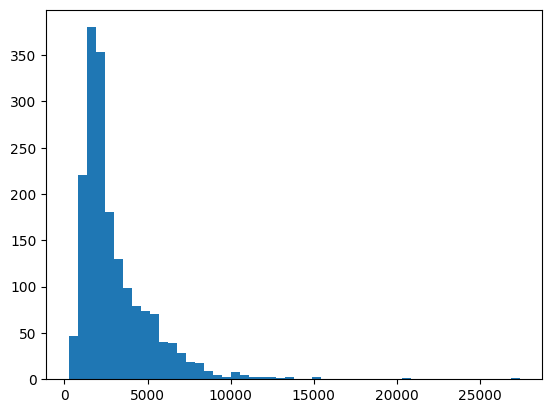

In [28]:
plt.hist(gobindpur_ponds_in_boundary_gdf['area_m2'],bins = 50);

In [29]:
gobindpur_ponds_in_boundary_gdf['area_m2'].describe()

count    1820.000
mean     2994.672
std      2158.098
min       250.879
25%      1597.857
50%      2263.920
75%      3824.674
max     27399.784
Name: area_m2, dtype: float64

In [30]:
gobindpur_swb_in_boundary_gdf.to_crs('epsg:7755',inplace=True)

In [31]:
gobindpur_swb_in_boundary_gdf['area_m2'] = gobindpur_swb_in_boundary_gdf['geometry'].area

In [32]:
gobindpur_swb_in_boundary_gdf.head()

,id,UID,geometry,area_m2
90,00000000000000000418,6_4104_1048,"MULTIPOLYGON (((4620015.09 3907515.353, 462001...",182.223
91,000000000000000016d3,6_4104_5843,"MULTIPOLYGON (((4620443.045 3907240.839, 46204...",976.926
135,00000000000000000e56,6_4218_3670,"MULTIPOLYGON (((4621040.078 3905997.489, 46210...",2114.429
136,00000000000000001df5,6_4218_7669,"MULTIPOLYGON (((4620193.931 3906116.946, 46201...",8901.661
137,00000000000000000e38,6_4218_3640,"MULTIPOLYGON (((4619834.272 3906081.319, 46198...",1827.674


In [33]:
gobindpur_swb_in_boundary_gdf['area_m2'].describe()

count       6600.000
mean       13037.056
std       558327.915
min           86.693
25%          182.853
50%          805.698
75%         2987.744
max     44838674.828
Name: area_m2, dtype: float64

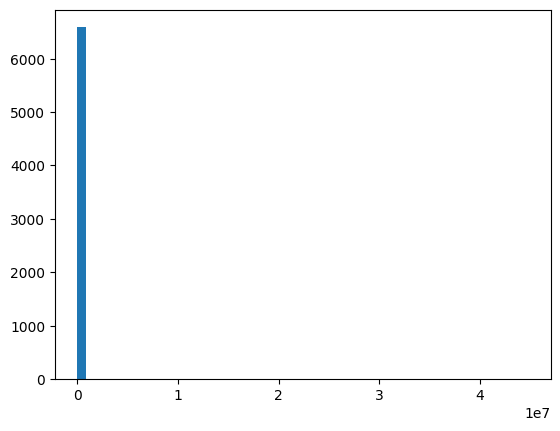

In [34]:
plt.hist(gobindpur_swb_in_boundary_gdf['area_m2'],bins = 50);

<Axes: >

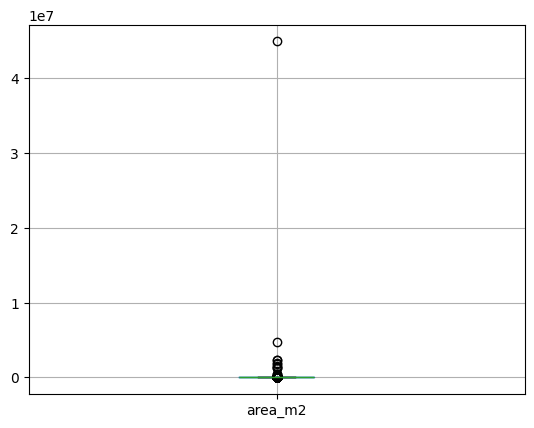

In [35]:
gobindpur_swb_in_boundary_gdf.boxplot()

In [36]:
gobindpur_swb_in_boundary_gdf['area_m2'].max()

np.float64(44838674.827773355)

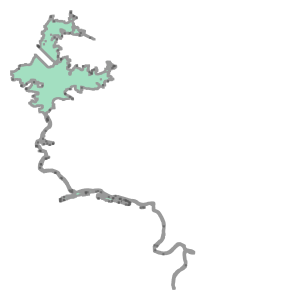

In [37]:
gobindpur_swb_in_boundary_gdf[gobindpur_swb_in_boundary_gdf['area_m2'] == gobindpur_swb_in_boundary_gdf['area_m2'].max()]['geometry'].iloc[0]

* Very large area SWBs

<Axes: >

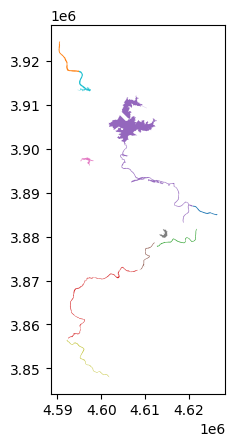

In [38]:
gobindpur_swb_in_boundary_gdf.sort_values('area_m2',ascending=False).head(10).plot(column='id')

In [39]:
# !pip install --upgrade nbformat

In [40]:
fig = px.box(gobindpur_swb_in_boundary_gdf, y="area_m2", points=False)
fig.show()

Summary table

In [41]:
dfSummary = pd.DataFrame({
    '#ponds_within_boundary' : [gobindpur_ponds_in_boundary_gdf.shape[0]],
    '#swb' : [gobindpur_swb_gdf.shape[0]],
    '#swb_within_boundary' : [gobindpur_swb_in_boundary_gdf.shape[0]],
    'median_ponds_area_m2' : [gobindpur_ponds_in_boundary_gdf['area_m2'].median()],
    'median_swb_area' : [gobindpur_swb_in_boundary_gdf['area_m2'].median()]
})

In [42]:
dfSummary

,#ponds_within_boundary,#swb,#swb_within_boundary,median_ponds_area_m2,median_swb_area
0,1820,8061,6600,2263.920,805.698


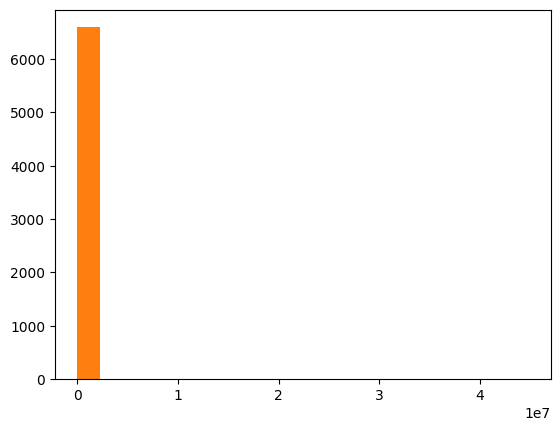

In [43]:
plt.hist(gobindpur_ponds_in_boundary_gdf['area_m2'],bins = 20);
plt.hist(gobindpur_swb_in_boundary_gdf['area_m2'],bins = 20);

* For better plotting, we remove the few very large SWBs (not from the dataframe only from the plot)

In [44]:
### Remove outliers in SWB data

Q1 = np.percentile(gobindpur_swb_in_boundary_gdf['area_m2'], 25)
Q3 = np.percentile(gobindpur_swb_in_boundary_gdf['area_m2'], 75)
IQR = Q3 - Q1

# Filtering data based on IQR
gobindpur_swb_large_filtered_gdf = gobindpur_swb_in_boundary_gdf[(gobindpur_swb_in_boundary_gdf['area_m2'] >= Q1 - 1.5 * IQR) & (gobindpur_swb_in_boundary_gdf['area_m2'] <= Q3 + 1.5 * IQR) ]

Text(-400, 1500, '618.01')

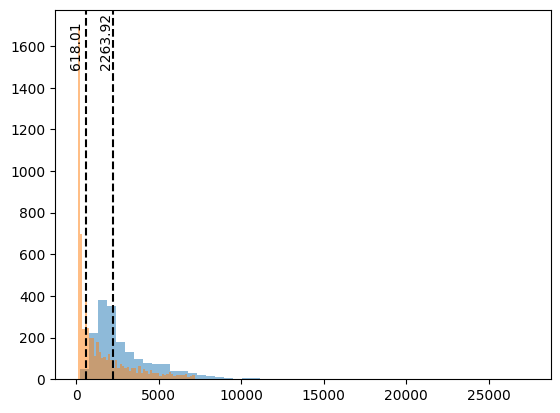

In [45]:
plt.hist(gobindpur_ponds_in_boundary_gdf['area_m2'],bins = 50,alpha = 0.5);
plt.axvline(gobindpur_ponds_in_boundary_gdf['area_m2'].median(),color = 'black',linestyle='dashed');
plt.text(1400,1500,str(round(gobindpur_ponds_in_boundary_gdf['area_m2'].median(),2)),rotation=90)
plt.hist(gobindpur_swb_large_filtered_gdf['area_m2'],bins = 50,alpha = 0.5);
plt.axvline(gobindpur_swb_large_filtered_gdf['area_m2'].median(),color = 'black',linestyle='dashed');
plt.text(-400,1500,str(round(gobindpur_swb_large_filtered_gdf['area_m2'].median(),2)),rotation=90)

### Merge

In [46]:
gobindpur_swb_in_boundary_gdf.overlay(gobindpur_ponds_in_boundary_gdf).shape

(1067, 6)

In [47]:
gobindpur_swb_in_boundary_gdf.overlay(gobindpur_ponds_in_boundary_gdf,how='union').shape

(9142, 6)

In [48]:
gobindpur_swb_in_boundary_gdf.shape[0] + gobindpur_ponds_in_boundary_gdf.shape[0] + 1067 - 339 - 14# - cases when intersection is full (in which case there will only be a single polygon)

9134

In [49]:
gobindpur_swb_in_boundary_gdf.sjoin(gobindpur_ponds_in_boundary_gdf).keys()

Index(['id', 'UID', 'geometry', 'area_m2_left', 'index_right', 'FID',
       'area_m2_right'],
      dtype='object')

In [50]:
gobindpur_swb_in_boundary_gdf.overlay(gobindpur_ponds_in_boundary_gdf).keys()

Index(['id', 'UID', 'area_m2_1', 'FID', 'area_m2_2', 'geometry'], dtype='object')

In [51]:
gobindpur_merged_gdf = gobindpur_swb_in_boundary_gdf.overlay(gobindpur_ponds_in_boundary_gdf,how='intersection')

In [52]:
gobindpur_merged_gdf.shape

(1067, 6)

In [53]:
# # intersection_map = gobindpur_ponds_in_boundary_gdf.explore(color='red')
# intersection_map = gobindpur_swb_in_boundary_gdf.explore(color='green')
# gobindpur_merged_gdf.explore(m=intersection_map,color='blue')
# # intersection_map

In [54]:
# intersection_map = gobindpur_ponds_in_boundary_gdf.explore(color='red')
# # intersection_map = gobindpur_swb_in_boundary_gdf.explore(color='green')
# gobindpur_merged_gdf.explore(m=intersection_map,color='blue')
# # intersection_map

### Combine remaining waterbodies to this

In [ ]:
gobindpur_swb_in_boundary_gdf.shape

In [ ]:
gobindpur_swb_in_boundary_gdf.overlay(gobindpur_merged_gdf,how='difference')

In [ ]:
gobindpur_merged1_gdf = pd.concat([gobindpur_merged_gdf,gobindpur_swb_in_boundary_gdf.overlay(gobindpur_merged_gdf,how='difference')])

In [ ]:
gobindpur_ponds_in_boundary_gdf.overlay(gobindpur_merged1_gdf,how='difference')

In [ ]:
gobindpur_merged1_gdf = pd.concat([gobindpur_merged1_gdf,gobindpur_ponds_in_boundary_gdf.overlay(gobindpur_merged1_gdf,how='difference')])

In [ ]:
gobindpur_merged1_gdf.shape

In [ ]:
gobindpur_merged1_gdf.groupby(['UID']).value_counts()

In [ ]:
gobindpur_merged1_gdf.shape

In [ ]:
# gobindpur_merged1_gdf.explore()

### Method2: 

In [ ]:
gobindpur_merged2_gdf = gobindpur_swb_in_boundary_gdf.overlay(gobindpur_ponds_in_boundary_gdf,
                                                              how='union')

In [ ]:
gobindpur_merged2_gdf.shape

In [ ]:
# gobindpur_swb_allkeys_gdf.shape

In [ ]:
gobindpur_swb_in_boundary_gdf.shape

In [ ]:
gobindpur_merged2_gdf.keys()

In [ ]:
gobindpur_merged2_gdf = gobindpur_merged2_gdf.merge(
    gobindpur_swb_allkeys_gdf.drop(['geometry'],axis=1),
    on = ['UID','id'],
    how='left'
)

In [ ]:
# gobindpur_merged2_gdf.explore()

In [ ]:
gobindpur_merged2_gdf[(gobindpur_merged2_gdf['FID'].notna()) & (gobindpur_merged2_gdf['UID'].notna())]

In [ ]:
gobindpur_merged2_gdf['UID'].nunique()

In [ ]:
gobindpur_merged2_gdf['FID'].nunique()

In [ ]:
gobindpur_merged2_gdf[gobindpur_merged2_gdf['UID'].notna() & gobindpur_merged2_gdf['FID'].isna()].shape

In [ ]:
gobindpur_merged2_gdf[gobindpur_merged2_gdf['FID'].notna() & gobindpur_merged2_gdf['UID'].isna()].shape

### Method 3

In [ ]:
gobindpur_merged3_gdf = gobindpur_swb_in_boundary_gdf.overlay(gobindpur_ponds_in_boundary_gdf,
                                                              how='union')

In [ ]:
gobindpur_merged3_gdf.shape

In [ ]:
gobindpur_merged3_gdf['UID'].isna().sum()

In [ ]:
gobindpur_merged3_gdf['FID'].isna().sum()

In [ ]:
# gobindpur_merged3_gdf.loc[gobindpur_merged3_gdf['UID'].isna(),'UID'] = gobindpur_merged3_gdf[gobindpur_merged3_gdf['UID'].isna()]['FID']

In [ ]:
# gobindpur_merged3_gdf['UID'].isna().sum()

In [ ]:
# gobindpur_merged3_gdf = gobindpur_merged3_gdf.groupby('UID').apply(lambda x:x.dissolve()) #doesnt work coz ponds uid is fid which
# is different than uid of intersecting swb

In [ ]:
gobindpur_merged3_gdf = gobindpur_merged3_gdf.dissolve(aggfunc='first').explode(index_parts=True) 
# Ref : https://stackoverflow.com/questions/73547342/how-to-find-intersecting-polygons-and-union-them-using-geopandas

In [ ]:
gobindpur_merged3_gdf

In [ ]:
gobindpur_merged3_gdf.shape

In [ ]:
gobindpur_ponds_in_boundary_gdf.shape[0]

In [ ]:
gobindpur_swb_in_boundary_gdf.shape[0]

In [ ]:
gobindpur_merged3_gdf.head()

In [ ]:
gobindpur_merged3_gdf['geometry'].nunique()

In [ ]:
# boundaries_merged_map = gobindpur_swb_in_boundary_gdf.explore(
#                                       style_kwds = {
#                                           'fillOpacity' : 0.1,
#                                           'opacity' : 0.3
#                                           })

# gobindpur_ponds_in_boundary_gdf.explore(m=boundaries_merged_map,
#                                       style_kwds = {
#                                           'fillOpacity' : 0.1,
#                                           'opacity' : 0.3
#                                           },
#                                           color='red'
#                                           )

# gobindpur_merged3_gdf.explore(m=boundaries_merged_map,
#                             #    style_kwds = {
#                             #               'fillOpacity' : 0.1,
#                             #               'opacity' : 0.3
#                             #               },
#                               color='green')


### Get remaining data in the merged dataframe
* As currently the merged dataframe only has unique geometries, but has lost all other data

In [ ]:
gobindpur_merged3_gdf = gobindpur_merged3_gdf[['geometry']].sjoin(gobindpur_swb_in_boundary_gdf,how='left')

In [ ]:
gobindpur_merged3_gdf.keys()

In [ ]:
gobindpur_merged3_gdf.rename(columns= {'area_m2' : 'area_m2_swb','index_right' : 'index_swb'},inplace=True)

In [ ]:
gobindpur_merged3_gdf.head()

In [ ]:
gobindpur_merged3_gdf.reset_index(drop=True,inplace=True)

In [ ]:
gobindpur_merged3_gdf = gobindpur_merged3_gdf.sjoin(gobindpur_ponds_in_boundary_gdf,how='left')

In [ ]:
gobindpur_merged3_gdf

In [ ]:
gobindpur_merged3_gdf.rename(columns= {'area_m2' : 'area_m2_pond','index_right' : 'index_pond'},inplace=True)

In [ ]:
# boundaries_merged_map = gobindpur_merged3_gdf.explore(
#     # style_kwds = {
#     #         'fillOpacity' : 0.1,
#     #         'opacity' : 0.3},
#             color='green')
# boundaries_merged_map

# # gobindpur_swb_in_boundary_gdf.explore(
# #     m=boundaries_merged_map,
# #     style_kwds = {
# #         'fillOpacity' : 0.1,
# #         'opacity' : 0.3})

# # gobindpur_ponds_in_boundary_gdf.explore(m=boundaries_merged_map,
# #                                       style_kwds = {
# #                                           'fillOpacity' : 0.1,
# #                                           'opacity' : 0.3
# #                                           },
# #                                           color='red'
# #                                           )

In [ ]:
# ponds_swb_map = gobindpur_ponds_in_boundary_gdf.explore(color="red")
# gobindpur_swb_in_boundary_gdf.explore(m=ponds_swb_map)

* Merged waterbody contains the respective FID and UID

* Now lets pull the remaining analysis columns from the swb table

In [ ]:
gobindpur_merged3_gdf.keys()

In [ ]:
gobindpur_swb_allkeys_gdf.to_crs('epsg:7755',inplace=True)

In [ ]:
gobindpur_merged3_gdf = gobindpur_merged3_gdf.sjoin(gobindpur_swb_allkeys_gdf,how='left')

In [ ]:
gobindpur_merged3_gdf.head()

In [ ]:
(gobindpur_merged3_gdf['id_left'] == gobindpur_merged3_gdf['id_right']).sum()

In [ ]:
gobindpur_merged3_gdf.keys()

Drop unnecessary columns

In [ ]:
gobindpur_merged3_gdf.shape

In [ ]:
gobindpur_merged3_gdf.drop(['id_left','id_right','index_swb','index_right','index_pond'],axis=1,inplace=True)

In [ ]:
gobindpur_merged3_gdf['FID'].isna().sum()

In [ ]:
gobindpur_merged3_gdf['UID_left'].isna().sum()

In [ ]:
gobindpur_merged3_gdf['UID_right'].isna().sum()

In [ ]:
(gobindpur_merged3_gdf['UID_left'] == gobindpur_merged3_gdf['UID_right']).all()

In [ ]:
(gobindpur_merged3_gdf['UID_left'] == gobindpur_merged3_gdf['UID_right']).sum()

In [ ]:
gobindpur_merged3_gdf[\
    gobindpur_merged3_gdf['UID_left'] != gobindpur_merged3_gdf['UID_right']
    ]

NaNs dont show up in equality operation!

In [ ]:
gobindpur_merged3_gdf.drop('UID_right',axis=1,inplace=True)

In [ ]:
gobindpur_merged3_gdf.rename(columns={'UID_left' : 'UID'},inplace=True)

In [ ]:
gobindpur_merged3_gdf[
    gobindpur_merged3_gdf['UID'].notna() & \
    gobindpur_merged3_gdf['FID'].notna()
].shape

In [ ]:
gobindpur_merged3_gdf['UID'].nunique()

In [ ]:
gobindpur_merged3_gdf['UID'].isna().sum()

In [ ]:
gobindpur_merged3_gdf['FID'].nunique()

In [ ]:
gobindpur_merged3_gdf

In [ ]:
# gobindpur_merged3_gdf.drop(['level_0','level_1'],axis=1,inplace=True)

In [ ]:
# gobindpur_merged3_gdf[['index','geometry','FID','UID']][:50].explore(column='index')

### Generate proper FID for ponds 
* Which will then also be the value of UIDs

In [ ]:
mws_gdf = gpd.read_file(
    os.path.join(
        os.environ['DATA'],
        'ponds_and_wells',
        'gobindpur_mws.json'        
    )
)

In [ ]:
mws_gdf = mws_gdf[['uid','geometry']]

In [ ]:
mws_gdf.columns = ['mws_id','geometry']

In [ ]:
mws_gdf.head()

In [ ]:
mws_merged_map = mws_gdf.explore(column='mws_id')
gobindpur_merged3_gdf[gobindpur_merged3_gdf['UID'].isna()].explore(m=mws_merged_map)
# gobindpur_swb_in_boundary_gdf.explore(m=mws_merged_map)

Whoaa! MWS boundary and model output arent matching fully!

In [ ]:
mws_gdf.to_crs('epsg:7755',inplace=True)

In [ ]:
gobindpur_merged3_gdf = gobindpur_merged3_gdf.sjoin(mws_gdf[['mws_id','geometry']],how='left')

In [ ]:
gobindpur_merged3_gdf.drop(['index_right'],axis=1,inplace=True)

In [ ]:
gobindpur_merged3_gdf.shape

In [ ]:
gobindpur_merged3_gdf.keys()

In [ ]:
len(gobindpur_merged3_gdf[gobindpur_merged3_gdf['UID'].isna()])

In [ ]:
gobindpur_merged3_gdf[gobindpur_merged3_gdf['UID'].isna()]['mws_id']

In [ ]:
gobindpur_merged3_gdf[gobindpur_merged3_gdf['UID'].isna()]['FID'].apply(lambda x:int(x))

- This FID is not useful as it contains all ponds (even those intersecting with waterbodies) so ID values of nonintersecting/standalone ponds
wont be continuous

- Let's create new FIDs for such scenarios? 

- Or to keep a tab of other ponds lets keep the original FIDs itself? 

In [ ]:
gobindpur_merged3_gdf[(gobindpur_merged3_gdf['UID'].isna()) & (gobindpur_merged3_gdf['mws_id'].notna())]['mws_id'] + \
'_' + gobindpur_merged3_gdf[(gobindpur_merged3_gdf['UID'].isna()) & (gobindpur_merged3_gdf['mws_id'].notna())]['FID'].apply(lambda x:str(int(x)))+ \
'_pond'


In [ ]:
new_FIDS = gobindpur_merged3_gdf[(gobindpur_merged3_gdf['UID'].isna()) & (gobindpur_merged3_gdf['mws_id'].notna())]['mws_id'] + \
'_' + gobindpur_merged3_gdf[(gobindpur_merged3_gdf['UID'].isna()) & (gobindpur_merged3_gdf['mws_id'].notna())]['FID'].apply(lambda x:str(int(x))) + \
'_pond'

In [ ]:
new_FIDS

In [ ]:
# new_FIDS.reset_index(drop=True)

In [ ]:
gobindpur_merged3_gdf['UID'].isna().sum()

In [ ]:
gobindpur_merged3_gdf.loc[(gobindpur_merged3_gdf['UID'].isna()) & (gobindpur_merged3_gdf['mws_id'].notna()),'UID'] = new_FIDS

In [ ]:
gobindpur_merged3_gdf['UID'].isna().sum()

In [ ]:
815 - 138

In [ ]:
gobindpur_merged3_gdf

* Rename intersection scenarios

In [ ]:
gobindpur_merged3_gdf.loc[(gobindpur_merged3_gdf['UID'].notna()) & (gobindpur_merged3_gdf['FID'].notna()),'UID'] = \
gobindpur_merged3_gdf[(gobindpur_merged3_gdf['UID'].notna()) & (gobindpur_merged3_gdf['FID'].notna())]['UID'].apply(
    lambda x:x + '_intersection'
)


### Groupby SWB (1 row per SWB)

In [ ]:
gobindpur_merged3_gdf.groupby(['UID']).size().sort_values(ascending=False).to_dict()

In [ ]:
gobindpur_merged3_gdf[gobindpur_merged3_gdf['UID'] == '6_1388_6_1928_6_2056_6_2485_6_4059_8060'].explore()

### Something crazy is happening with the explode dissolve operation!! 
- That needs to be undone!

- Example UID: 6_1388_6_1928_6_2056_6_2485_6_4059_8060

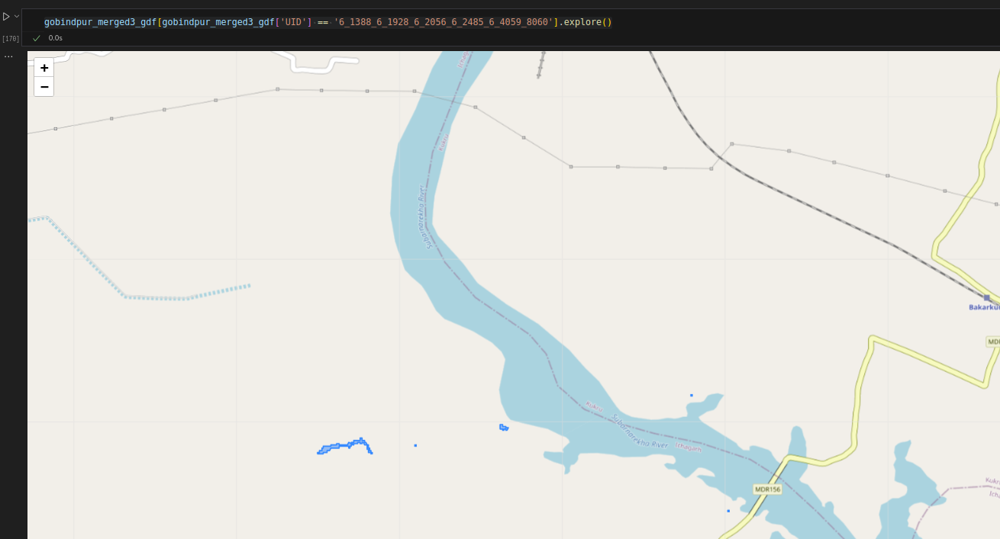

* It makes sense to merge all such cases into a single row

In [ ]:
gobindpur_merged3_gdf.head()

### Final logic

### 1. Add to final dataframe UIDs not in intersecting UIDs list

In [342]:
intersecting_UIDs = gobindpur_swb_in_boundary_gdf.sjoin(gobindpur_ponds_in_boundary_gdf)['UID'].tolist()

In [343]:
standalone_swb_gdf = gobindpur_swb_in_boundary_gdf[~gobindpur_swb_in_boundary_gdf['UID'].isin(intersecting_UIDs)]

In [344]:
standalone_swb_gdf.shape

(5561, 4)

In [345]:
# standalone_swb_plot = gobindpur_ponds_in_boundary_gdf.explore(color='red')
# standalone_swb_gdf.explore(m=standalone_swb_plot)

* Add to final merged gdf

In [346]:
merged_gdf = standalone_swb_gdf

### Get standalone ponds

In [347]:
intersecting_FIDs = gobindpur_ponds_in_boundary_gdf.sjoin(gobindpur_swb_in_boundary_gdf)['FID'].tolist()

In [348]:
standalone_ponds_gdf = gobindpur_ponds_in_boundary_gdf[~gobindpur_ponds_in_boundary_gdf['FID'].isin(intersecting_FIDs)]

In [349]:
standalone_ponds_gdf.shape

(812, 3)

In [350]:
# standalone_ponds_plot = gobindpur_swb_in_boundary_gdf.explore()
# standalone_ponds_gdf.explore(m=standalone_ponds_plot,color='red')

* Add to final merged gdf

In [351]:
merged_gdf

,id,UID,geometry,area_m2
135,00000000000000000e56,6_4218_3670,"MULTIPOLYGON (((4621040.078 3905997.489, 46210...",2114.429
140,00000000000000001619,6_4276_5657,"MULTIPOLYGON (((4623857.6 3905652.671, 4623856...",1433.049
142,00000000000000000eb8,6_4218_3768,"MULTIPOLYGON (((4619470.283 3905508.894, 46194...",5362.887
169,000000000000000002a9,6_3087_681,"MULTIPOLYGON (((4617115.036 3911841.352, 46171...",86.788
170,00000000000000000e30,6_3087_3632,"MULTIPOLYGON (((4617150.875 3912047.959, 46171...",2026.692
...,...,...,...,...
7923,000000000000000010bf,6_2269_4287,"MULTIPOLYGON (((4591479.618 3865730.294, 45914...",348.288
7943,00000000000000001f3b,6_3496_6_3696_6_3553_7995,"MULTIPOLYGON (((4575705.333 3869387.812, 45757...",57418.696
7944,000000000000000000b9,6_3496_185,"MULTIPOLYGON (((4577483.189 3868903.13, 457748...",91.401
7945,00000000000000001e9f,6_3496_7839,"MULTIPOLYGON (((4577596.161 3869464.661, 45776...",37585.951


In [352]:
merged_gdf = pd.concat([merged_gdf,standalone_ponds_gdf])

In [353]:
merged_gdf.head()

,id,UID,geometry,area_m2,FID
135,00000000000000000e56,6_4218_3670,"MULTIPOLYGON (((4621040.078 3905997.489, 46210...",2114.429,NaN
140,00000000000000001619,6_4276_5657,"MULTIPOLYGON (((4623857.6 3905652.671, 4623856...",1433.049,NaN
142,00000000000000000eb8,6_4218_3768,"MULTIPOLYGON (((4619470.283 3905508.894, 46194...",5362.887,NaN
169,000000000000000002a9,6_3087_681,"MULTIPOLYGON (((4617115.036 3911841.352, 46171...",86.788,NaN
170,00000000000000000e30,6_3087_3632,"MULTIPOLYGON (((4617150.875 3912047.959, 46171...",2026.692,NaN


### Intersection scenarios

* Single intersection per SWB and pond
* Multi intersection per SWB
* Multi intersection per pond

In [354]:
intersecting_ponds_gdf = gobindpur_ponds_in_boundary_gdf[gobindpur_ponds_in_boundary_gdf['FID'].isin(intersecting_FIDs)]

In [355]:
intersecting_ponds_gdf.shape

(1008, 3)

In [356]:
intersecting_swb_gdf = gobindpur_swb_in_boundary_gdf[gobindpur_swb_in_boundary_gdf['UID'].isin(intersecting_UIDs)]

In [357]:
intersecting_swb_gdf.shape

(1039, 4)

In [358]:
intersections_gdf = gobindpur_swb_in_boundary_gdf.sjoin(gobindpur_ponds_in_boundary_gdf)

In [359]:
intersections_gdf.shape

(1067, 7)

In [360]:
intersections_gdf.drop(['index_right'],axis=1,inplace=True)

In [361]:
intersections_gdf.head()

,id,UID,geometry,area_m2_left,FID,area_m2_right
90,00000000000000000418,6_4104_1048,"MULTIPOLYGON (((4620015.09 3907515.353, 462001...",182.223,1151,1987.693
91,000000000000000016d3,6_4104_5843,"MULTIPOLYGON (((4620443.045 3907240.839, 46204...",976.926,1114,2684.238
136,00000000000000001df5,6_4218_7669,"MULTIPOLYGON (((4620193.931 3906116.946, 46201...",8901.661,1137,2996.639
137,00000000000000000e38,6_4218_3640,"MULTIPOLYGON (((4619834.272 3906081.319, 46198...",1827.674,1171,4933.027
141,000000000000000015f1,6_4276_5617,"MULTIPOLYGON (((4623081.457 3905628.169, 46230...",616.404,916,2594.157


In [362]:
intersections_gdf.rename(columns={'area_m2_left' : 'area_m2_swb','area_m2_right' : 'area_m2_pond'},inplace=True)

In [363]:
uid_fid_gdf = intersections_gdf.groupby(['UID'])['FID'].unique().reset_index()

In [364]:
sort_index = uid_fid_gdf['FID'].apply(lambda x:len(x)).sort_values(ascending=False).reset_index()

In [365]:
sort_index.columns = ['index','length']

In [366]:
sort_index

,index,length
0,930,20
1,752,4
2,915,4
3,20,2
4,493,2
...,...,...
1034,343,1
1035,342,1
1036,341,1
1037,340,1


In [367]:
uid_fid_gdf = uid_fid_gdf.loc[sort_index['index']] #sort of a small breakthrough, to arrange df 

In [368]:
uid_fid_gdf

,UID,FID
930,6_440_6_1088_6_1291_6_1556_6_2706_6_2785_6_283...,"[1356, 1218, 1334, 1249, 2122, 1869, 2012, 197..."
752,6_3812_6_3894_6_3938_6_3991_6_4133_6_4254_6_40...,"[1418, 1158, 1336, 1238]"
915,6_437_6_1454_6_1610_6_1777_6_1889_6_2036_6_218...,"[2924, 3167, 2579, 2281]"
20,6_1084_6_1421_6_4571_8025,"[2609, 2625]"
493,6_3181_137,"[1569, 1562]"
...,...,...
343,6_2561_1944,[2613]
342,6_2495_7837,[2577]
341,6_2495_7606,[2342]
340,6_2495_7514,[2577]


* Similarly lets do the pond -> swb intersection df

In [369]:
fid_uid_gdf = intersections_gdf.groupby(['FID'])['UID'].unique().reset_index()

In [370]:
fid_uid_gdf

,FID,UID
0,707,[12_377059_4661]
1,792,[12_376616_3498]
2,798,[12_376616_5944]
3,910,[6_2562_3044]
4,916,[6_4276_5617]
...,...,...
1003,4162,[6_3184_7615]
1004,4202,[6_3381_5661]
1005,4229,[6_3381_4014]
1006,4292,[6_3292_5426]


In [371]:
sort_index = fid_uid_gdf['UID'].apply(lambda x:len(x)).sort_values(ascending=False).reset_index()

In [372]:
sort_index.columns = ['index','length']

In [373]:
fid_uid_gdf = fid_uid_gdf.loc[sort_index['index']] #sort of a small breakthrough, to arrange df 

In [374]:
fid_uid_gdf

,FID,UID
599,2577,"[6_2495_1410, 6_2495_7141, 6_2495_7837, 6_2495..."
425,2148,"[6_3645_6967, 6_3645_7051, 6_3645_7401]"
866,3389,"[6_1569_5802, 6_1569_6858, 6_1569_6971]"
410,2100,"[6_4747_6145, 6_4747_5769, 6_4747_5588]"
492,2338,"[6_4790_3915, 6_4790_1493, 6_4790_77]"
...,...,...
353,1954,[6_3113_6_3294_7679]
354,1960,[6_4699_7380]
355,1964,[6_3383_7464]
356,1966,[6_3458_64]


In [375]:
single_intersection_UIDs = uid_fid_gdf[uid_fid_gdf['FID'].apply(lambda x:len(x)) == 1]['UID']

In [376]:
single_intersection_UIDs = single_intersection_UIDs.tolist()

In [377]:
swb_1_pond_1_case = []
for x in single_intersection_UIDs:
    for y in fid_uid_gdf['UID']:
        if (x in y):
            if (len(y) == 1):
                swb_1_pond_1_case.append(x)

In [378]:
len(swb_1_pond_1_case)

923

In [379]:
swb_1_pond_multi_case = []
for x in single_intersection_UIDs:
    for y in fid_uid_gdf['UID']:
        if (x in y):
            if (len(y) > 1):
                swb_1_pond_multi_case.append(x)

In [380]:
len(swb_1_pond_multi_case)

110

In [381]:
single_intersection_FIDs = fid_uid_gdf[fid_uid_gdf['UID'].apply(lambda x:len(x)) == 1]['FID']

In [382]:
single_intersection_FIDs = single_intersection_FIDs.tolist()

In [383]:
len(single_intersection_FIDs)

956

In [384]:
multi_intersection_UIDs = uid_fid_gdf[uid_fid_gdf['FID'].apply(lambda x:len(x)) > 1]['UID']

In [385]:
multi_intersection_UIDs = multi_intersection_UIDs.tolist()

In [386]:
uid_fid_gdf

,UID,FID
930,6_440_6_1088_6_1291_6_1556_6_2706_6_2785_6_283...,"[1356, 1218, 1334, 1249, 2122, 1869, 2012, 197..."
752,6_3812_6_3894_6_3938_6_3991_6_4133_6_4254_6_40...,"[1418, 1158, 1336, 1238]"
915,6_437_6_1454_6_1610_6_1777_6_1889_6_2036_6_218...,"[2924, 3167, 2579, 2281]"
20,6_1084_6_1421_6_4571_8025,"[2609, 2625]"
493,6_3181_137,"[1569, 1562]"
...,...,...
343,6_2561_1944,[2613]
342,6_2495_7837,[2577]
341,6_2495_7606,[2342]
340,6_2495_7514,[2577]


In [387]:
swb_multi_pond_1_case = []
for x in single_intersection_FIDs:
    for y in uid_fid_gdf['FID']:
        if (x in y):
            if (len(y) > 1):
                swb_multi_pond_1_case.append(x)

In [388]:
len(swb_multi_pond_1_case)

33

In [389]:
swb_multi_pond_multi_case = []
for x in multi_intersection_UIDs:
    for y in fid_uid_gdf['UID']:
        if (x in y):
            if (len(y) > 1):
                swb_multi_pond_multi_case.append(x)

In [390]:
len(swb_multi_pond_multi_case)

1

In [391]:
print(len(swb_1_pond_1_case))
print(len(swb_1_pond_multi_case))
print(len(swb_multi_pond_1_case))
print(len(swb_multi_pond_multi_case))

923
110
33
1


In [392]:
case4_plot = gobindpur_swb_in_boundary_gdf[gobindpur_swb_in_boundary_gdf['UID'].isin(swb_multi_pond_multi_case)].explore(color='blue')
# gobindpur_swb_in_boundary_gdf.explore(m=case4_plot)
case4_plot

In [393]:
merged_gdf.shape

(6373, 5)

In [394]:
swb_1_pond_1_case

['6_3593_6203',
 '6_3593_6596',
 '6_3593_6890',
 '6_3593_594',
 '6_3593_5733',
 '6_3593_6988',
 '6_3593_3560',
 '6_3593_7009',
 '6_3593_7034',
 '6_3593_7344',
 '6_3645_6607',
 '6_3645_6413',
 '6_3645_6186',
 '6_3645_5883',
 '6_3645_5793',
 '6_3645_5144',
 '6_3645_4100',
 '6_3645_3332',
 '6_3593_7694',
 '6_3645_1179',
 '6_3645_1175',
 '6_3639_7662',
 '6_3639_7516',
 '6_3639_5666',
 '6_3639_1783',
 '6_3593_3548',
 '6_3645_2834',
 '6_3560_4602',
 '6_3560_5181',
 '6_3560_5546',
 '6_3560_5704',
 '6_3560_5800',
 '6_3560_5963',
 '6_3560_6015',
 '6_3560_6017',
 '6_3560_6147',
 '6_3560_6187',
 '6_3560_6204',
 '6_3592_6891',
 '6_3560_6610',
 '6_3560_6739',
 '6_3560_6882',
 '6_3560_6_3593_2492',
 '6_3560_6_3593_5425',
 '6_3560_6_3593_5603',
 '6_3560_7065',
 '6_3560_7363',
 '6_3589_6877',
 '6_3592_5844',
 '6_3592_6039',
 '6_3592_6519',
 '6_3645_6732',
 '6_3593_1351',
 '6_3593_3016',
 '6_3560_6231',
 '6_3681_963',
 '6_3696_1073',
 '6_3696_6136',
 '6_3696_6438',
 '6_3696_6_3007_1373',
 '6_3696_7973'

In [395]:
single_intersections_swb_gdf = gobindpur_swb_in_boundary_gdf[gobindpur_swb_in_boundary_gdf['UID'].isin(swb_1_pond_1_case)]

In [396]:
single_intersections_swb_gdf

,id,UID,geometry,area_m2
90,00000000000000000418,6_4104_1048,"MULTIPOLYGON (((4620015.09 3907515.353, 462001...",182.223
91,000000000000000016d3,6_4104_5843,"MULTIPOLYGON (((4620443.045 3907240.839, 46204...",976.926
136,00000000000000001df5,6_4218_7669,"MULTIPOLYGON (((4620193.931 3906116.946, 46201...",8901.661
137,00000000000000000e38,6_4218_3640,"MULTIPOLYGON (((4619834.272 3906081.319, 46198...",1827.674
141,000000000000000015f1,6_4276_5617,"MULTIPOLYGON (((4623081.457 3905628.169, 46230...",616.404
...,...,...,...,...
7850,000000000000000016f5,6_1086_5877,"MULTIPOLYGON (((4593493.21 3856585.761, 459349...",1481.260
7854,00000000000000000c6a,6_1086_3178,"MULTIPOLYGON (((4593704.201 3856955.723, 45937...",540.275
7917,000000000000000018fa,6_2183_6394,"MULTIPOLYGON (((4591571.042 3867228.063, 45915...",3535.378
7961,00000000000000001a37,6_2183_6711,"MULTIPOLYGON (((4591945.579 3862810.259, 45919...",3353.846


* Get the intersecting pond's id

In [397]:
intersections_gdf.keys()

Index(['id', 'UID', 'geometry', 'area_m2_swb', 'FID', 'area_m2_pond'], dtype='object')

In [398]:
single_intersections_gdf = single_intersections_swb_gdf.sjoin(intersections_gdf[['geometry','FID','area_m2_pond']],how='left')

* Now we just need to update the geometry to be the union of the corresponding geometries
    * First lets get pond geometry in the dataframe

In [399]:
single_intersections_gdf

,id,UID,geometry,area_m2,index_right,FID,area_m2_pond
90,00000000000000000418,6_4104_1048,"MULTIPOLYGON (((4620015.09 3907515.353, 462001...",182.223,90,1151,1987.693
91,000000000000000016d3,6_4104_5843,"MULTIPOLYGON (((4620443.045 3907240.839, 46204...",976.926,91,1114,2684.238
136,00000000000000001df5,6_4218_7669,"MULTIPOLYGON (((4620193.931 3906116.946, 46201...",8901.661,136,1137,2996.639
137,00000000000000000e38,6_4218_3640,"MULTIPOLYGON (((4619834.272 3906081.319, 46198...",1827.674,137,1171,4933.027
141,000000000000000015f1,6_4276_5617,"MULTIPOLYGON (((4623081.457 3905628.169, 46230...",616.404,141,916,2594.157
...,...,...,...,...,...,...,...
7850,000000000000000016f5,6_1086_5877,"MULTIPOLYGON (((4593493.21 3856585.761, 459349...",1481.260,7850,3150,2842.630
7854,00000000000000000c6a,6_1086_3178,"MULTIPOLYGON (((4593704.201 3856955.723, 45937...",540.275,7854,3133,3067.932
7917,000000000000000018fa,6_2183_6394,"MULTIPOLYGON (((4591571.042 3867228.063, 45915...",3535.378,7917,3247,5447.205
7961,00000000000000001a37,6_2183_6711,"MULTIPOLYGON (((4591945.579 3862810.259, 45919...",3353.846,7961,3221,9216.004


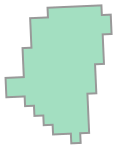

In [400]:
single_intersections_gdf[single_intersections_gdf['FID'] == 1137]['geometry'].iloc[0]

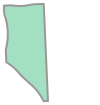

In [401]:
gobindpur_ponds_in_boundary_gdf[gobindpur_ponds_in_boundary_gdf['FID'] == 1137]['geometry'].iloc[0]

In [402]:
import shapely
from shapely import ops

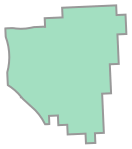

In [403]:
shapely.ops.unary_union([single_intersections_gdf[single_intersections_gdf['FID'] == 1137]['geometry'].iloc[0],
                           gobindpur_ponds_in_boundary_gdf[gobindpur_ponds_in_boundary_gdf['FID'] == 1137]['geometry'].iloc[0]]
                           )

Nice!

In [404]:
single_intersections_gdf.drop(['index_right'],axis=1,inplace=True)

In [405]:
for index,row in single_intersections_gdf.iterrows():
    single_intersections_gdf.loc[index,'geometry'] = shapely.ops.unary_union(
        [
            row['geometry'],
            gobindpur_ponds_in_boundary_gdf[gobindpur_ponds_in_boundary_gdf['FID'] == row['FID']]['geometry'].iloc[0]
        ]
    ) #new find: without the .loc it wont update the original value of the row geometries. like row['geometry] = unary_union(row['geometry'],pond['geometry']) didnt update the value

    #TODO: see if this can be improved. https://stackoverflow.com/questions/16476924/how-can-i-iterate-over-rows-in-a-pandas-dataframe

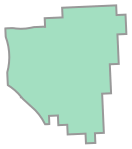

In [406]:
single_intersections_gdf[single_intersections_gdf['FID'] == 1137]['geometry'].iloc[0]

* Merge to final dataframe

In [407]:
merged_gdf = \
    pd.concat(
        [
            merged_gdf,
            single_intersections_gdf
        ]
)

In [408]:
merged_gdf.shape

(7296, 6)

#### Case 2: 1 pond intersecting with multiple SWBs 

In [409]:
len(fid_uid_gdf[fid_uid_gdf['FID'] == 1356]['UID'])

1

In [410]:
fid_uid_gdf['UID']

599    [6_2495_1410, 6_2495_7141, 6_2495_7837, 6_2495...
425              [6_3645_6967, 6_3645_7051, 6_3645_7401]
866              [6_1569_5802, 6_1569_6858, 6_1569_6971]
410              [6_4747_6145, 6_4747_5769, 6_4747_5588]
492                [6_4790_3915, 6_4790_1493, 6_4790_77]
                             ...                        
353                                 [6_3113_6_3294_7679]
354                                        [6_4699_7380]
355                                        [6_3383_7464]
356                                          [6_3458_64]
340                                         [6_3681_963]
Name: UID, Length: 1008, dtype: object

In [411]:
[row for row in fid_uid_gdf['UID'] if '6_3526_6_3812_145' in row]

[array(['6_440_6_1088_6_1291_6_1556_6_2706_6_2785_6_2831_6_2909_6_2954_6_2960_6_2999_6_3154_6_3181_6_3196_6_3350_6_3424_6_3458_6_3491_6_3500_6_3526_6_3546_6_3930_6_4747_6_4777_6_5011_6_1710_6_2867_6_2920_6_3050_6_3295_150',
        '6_3526_6_3812_145'], dtype=object)]

Why is FID 1356 here? 

Because of this!
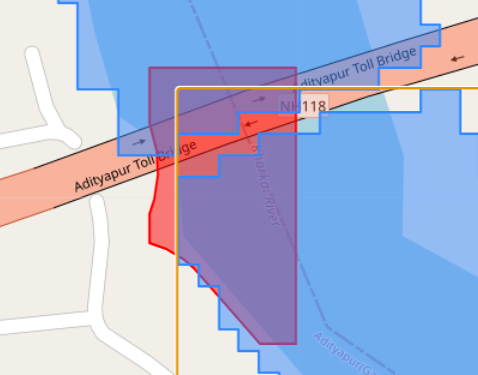

In [412]:
case2_plot = gobindpur_ponds_in_boundary_gdf.explore(color='red')
gobindpur_swb_in_boundary_gdf[gobindpur_swb_in_boundary_gdf['UID'].isin(swb_1_pond_multi_case)].explore(
    m=case2_plot)

In [413]:
# ponds_swb_plot = gobindpur_ponds_in_boundary_gdf.explore(color='red')
# gobindpur_swb_in_boundary_gdf.explore(
#     m=ponds_swb_plot)

* Best relooked at after removing merge from the ponds inference stage

* For now in these cases, lets just keep the SWB and drop the ponds!

In [414]:
swb_1_pond_multi_intersections_gdf = gobindpur_swb_in_boundary_gdf[gobindpur_swb_in_boundary_gdf['UID'].isin(swb_1_pond_multi_case)].sjoin(gobindpur_ponds_in_boundary_gdf)

In [415]:
swb_1_pond_multi_intersections_gdf.drop(['index_right'],inplace=True,axis=1)

In [416]:
swb_1_pond_multi_intersections_gdf.head()

,id,UID,geometry,area_m2_left,FID,area_m2_right
257,000000000000000018e9,6_4084_6377,"MULTIPOLYGON (((4618482.995 3906793.904, 46184...",2209.931,1284,4090.968
259,00000000000000001d52,6_4084_7506,"MULTIPOLYGON (((4618424.558 3906888.78, 461842...",7238.011,1284,4090.968
590,00000000000000001da7,6_4718_7591,"MULTIPOLYGON (((4621066.361 3897981.415, 46210...",9136.476,1088,7653.912
592,00000000000000001698,6_4718_5784,"MULTIPOLYGON (((4621117.588 3898052.012, 46211...",1042.519,1088,7653.912
594,00000000000000001c6d,6_4218_7277,"MULTIPOLYGON (((4618659.978 3905229.143, 46186...",5015.494,1274,11655.944


In [ ]:
swb_1_pond_multi_intersections_gdf.shape  

(110, 6)

* Add to merged gdf

In [418]:
merged_gdf = \
    pd.concat(
        [
            merged_gdf,
            swb_1_pond_multi_intersections_gdf
        ]
)

In [419]:
merged_gdf.shape

(7406, 8)

### Case 3: SWB intersects with more than 1 pond

In [420]:
swb_multi_pond_1_case

[2924,
 2625,
 2555,
 2574,
 2579,
 2609,
 3167,
 1562,
 1569,
 1218,
 1238,
 1249,
 1334,
 1158,
 1418,
 1443,
 1336,
 1388,
 2142,
 2176,
 2064,
 2066,
 2095,
 2122,
 2281,
 1830,
 1853,
 1869,
 1755,
 1773,
 1774,
 1971,
 2012]

In [315]:
case3_plot = gobindpur_swb_in_boundary_gdf.explore(color='blue')
gobindpur_ponds_in_boundary_gdf[gobindpur_ponds_in_boundary_gdf['FID'].isin(swb_multi_pond_1_case)].explore(
    m=case3_plot,color='red')

* We keep the SWB boundaries in this case, and keep comma separated values of intersecting FIDs

In [421]:
multi_intersection_UIDs

['6_440_6_1088_6_1291_6_1556_6_2706_6_2785_6_2831_6_2909_6_2954_6_2960_6_2999_6_3154_6_3181_6_3196_6_3350_6_3424_6_3458_6_3491_6_3500_6_3526_6_3546_6_3930_6_4747_6_4777_6_5011_6_1710_6_2867_6_2920_6_3050_6_3295_150',
 '6_3812_6_3894_6_3938_6_3991_6_4133_6_4254_6_4092_148',
 '6_437_6_1454_6_1610_6_1777_6_1889_6_2036_6_2183_6_2403_6_2462_6_2495_6_3558_6_438_6_1086_149',
 '6_1084_6_1421_6_4571_8025',
 '6_3181_137',
 '6_4284_6_4311_8051']

In [422]:
uid_fid_gdf[uid_fid_gdf['UID'].isin(multi_intersection_UIDs)]

,UID,FID
930,6_440_6_1088_6_1291_6_1556_6_2706_6_2785_6_283...,"[1356, 1218, 1334, 1249, 2122, 1869, 2012, 197..."
752,6_3812_6_3894_6_3938_6_3991_6_4133_6_4254_6_40...,"[1418, 1158, 1336, 1238]"
915,6_437_6_1454_6_1610_6_1777_6_1889_6_2036_6_218...,"[2924, 3167, 2579, 2281]"
20,6_1084_6_1421_6_4571_8025,"[2609, 2625]"
493,6_3181_137,"[1569, 1562]"
888,6_4284_6_4311_8051,"[2555, 2574]"


In [423]:
merged_gdf['FID'] = merged_gdf['FID'].astype(object)

In [426]:
merged_gdf.shape

(7406, 8)

In [428]:
swb_multi_pond_1_intersections_gdf = gobindpur_swb_in_boundary_gdf[gobindpur_swb_in_boundary_gdf['UID'].isin(multi_intersection_UIDs)]
swb_multi_pond_1_intersections_gdf

,id,UID,geometry,area_m2
631,00000000000000000089,6_3181_137,"MULTIPOLYGON (((4614883.686 3905377.219, 46148...",56480.920
3641,00000000000000000096,6_440_6_1088_6_1291_6_1556_6_2706_6_2785_6_283...,"MULTIPOLYGON (((4619939.458 3885695.402, 46199...",44838674.828
3679,00000000000000001f73,6_4284_6_4311_8051,"MULTIPOLYGON (((4599935.113 3882676.427, 45999...",150484.566
4387,00000000000000000094,6_3812_6_3894_6_3938_6_3991_6_4133_6_4254_6_40...,"MULTIPOLYGON (((4621580.316 3880483.835, 46215...",1876188.394
5738,00000000000000001f59,6_1084_6_1421_6_4571_8025,"MULTIPOLYGON (((4598247.577 3879109.224, 45982...",48997.305
7853,00000000000000000095,6_437_6_1454_6_1610_6_1777_6_1889_6_2036_6_218...,"MULTIPOLYGON (((4606962.205 3872067.331, 46069...",4696992.042


In [ ]:
# test = pd.DataFrame(
#     data={
#         'A' : [1,2,2,1],
#         'B' : ['P','P','Q','R']
#     }
# )

In [ ]:
# test

,A,B
0,1,P
1,2,P
2,2,Q
3,1,R


In [ ]:
# test_agg = test.groupby(['A'])['B'].agg(set).reset_index()

In [ ]:
# test_agg

,A,B
0,1,"{R, P}"
1,2,"{P, Q}"


In [ ]:
# test_agg['B'].apply(lambda x:list(x))

0    [R, P]
1    [P, Q]
Name: B, dtype: object

In [429]:
swb_multi_pond_1_intersections_gdf.shape

(6, 4)

In [449]:
swb_multi_pond_1_intersections_gdf

,id,UID,geometry,area_m2
631,00000000000000000089,6_3181_137,"MULTIPOLYGON (((4614883.686 3905377.219, 46148...",56480.920
3641,00000000000000000096,6_440_6_1088_6_1291_6_1556_6_2706_6_2785_6_283...,"MULTIPOLYGON (((4619939.458 3885695.402, 46199...",44838674.828
3679,00000000000000001f73,6_4284_6_4311_8051,"MULTIPOLYGON (((4599935.113 3882676.427, 45999...",150484.566
4387,00000000000000000094,6_3812_6_3894_6_3938_6_3991_6_4133_6_4254_6_40...,"MULTIPOLYGON (((4621580.316 3880483.835, 46215...",1876188.394
5738,00000000000000001f59,6_1084_6_1421_6_4571_8025,"MULTIPOLYGON (((4598247.577 3879109.224, 45982...",48997.305
7853,00000000000000000095,6_437_6_1454_6_1610_6_1777_6_1889_6_2036_6_218...,"MULTIPOLYGON (((4606962.205 3872067.331, 46069...",4696992.042


In [452]:
case3_fids_gdf = swb_multi_pond_1_intersections_gdf.sjoin(
    gobindpur_ponds_in_boundary_gdf
).groupby(['UID'])['FID'].agg(set).reset_index()

In [455]:
case3_fids_gdf['FID'] = case3_fids_gdf['FID'].apply(list)

In [456]:
case3_fids_gdf

,UID,FID
0,6_1084_6_1421_6_4571_8025,"[2625, 2609]"
1,6_3181_137,"[1569, 1562]"
2,6_3812_6_3894_6_3938_6_3991_6_4133_6_4254_6_40...,"[1336, 1418, 1238, 1158]"
3,6_4284_6_4311_8051,"[2555, 2574]"
4,6_437_6_1454_6_1610_6_1777_6_1889_6_2036_6_218...,"[2281, 2579, 2924, 3167]"
5,6_440_6_1088_6_1291_6_1556_6_2706_6_2785_6_283...,"[2176, 2064, 2066, 1443, 1830, 2095, 1971, 133..."


In [458]:
swb_multi_pond_1_intersections_gdf = swb_multi_pond_1_intersections_gdf.merge(case3_fids_gdf)

In [459]:
merged_gdf = \
    pd.concat(
        [
            merged_gdf,
            swb_multi_pond_1_intersections_gdf
        ]
)

In [462]:
merged_gdf.head()

,id,UID,geometry,area_m2,FID,area_m2_pond,area_m2_left,area_m2_right
135,00000000000000000e56,6_4218_3670,"MULTIPOLYGON (((4621040.078 3905997.489, 46210...",2114.429,NaN,NaN,NaN,NaN
140,00000000000000001619,6_4276_5657,"MULTIPOLYGON (((4623857.6 3905652.671, 4623856...",1433.049,NaN,NaN,NaN,NaN
142,00000000000000000eb8,6_4218_3768,"MULTIPOLYGON (((4619470.283 3905508.894, 46194...",5362.887,NaN,NaN,NaN,NaN
169,000000000000000002a9,6_3087_681,"MULTIPOLYGON (((4617115.036 3911841.352, 46171...",86.788,NaN,NaN,NaN,NaN
170,00000000000000000e30,6_3087_3632,"MULTIPOLYGON (((4617150.875 3912047.959, 46171...",2026.692,NaN,NaN,NaN,NaN


### Case 4: 
* Single instance (that too due to perhaps merging at ponds inference level /or buffer around boundaries)

* We keep the SWB boundary itself 

In [461]:
swb_multi_pond_multi_case

['6_440_6_1088_6_1291_6_1556_6_2706_6_2785_6_2831_6_2909_6_2954_6_2960_6_2999_6_3154_6_3181_6_3196_6_3350_6_3424_6_3458_6_3491_6_3500_6_3526_6_3546_6_3930_6_4747_6_4777_6_5011_6_1710_6_2867_6_2920_6_3050_6_3295_150']

In [469]:
set(swb_multi_pond_multi_case).issubset(merged_gdf['UID']) 

True

* If there are any new SWBs then we add them to the merged df, in this case there are no new ones so we are done.

In [470]:
merged_gdf.shape

(7412, 8)

##### Add analysis columns

##### Naming of ponds in standalone ponds case